In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import matplotlib.pyplot as plt
%matplotlib inline
import ydata_profiling as pp 

In [5]:
df = pd.read_csv("Dataset/fitbit.csv")

In [6]:
df.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
0,1503960366,3/25/2016,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819
1,1503960366,3/26/2016,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154
2,1503960366,3/27/2016,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944
3,1503960366,3/28/2016,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932
4,1503960366,3/29/2016,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886


<Axes: xlabel='TotalSteps', ylabel='Calories'>

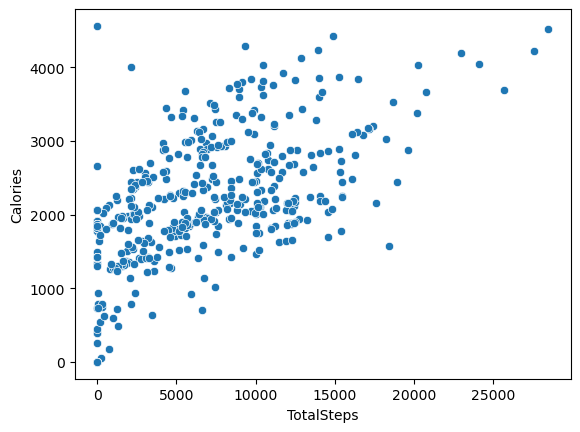

In [7]:
sns.scatterplot(x = df.TotalSteps,y =df.Calories )

In [8]:
df.shape

(457, 15)

In [9]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
#handeling zeroes in totalsteps

In [11]:
df.isnull().sum()

Id                          0
ActivityDate                0
TotalSteps                  0
TotalDistance               0
TrackerDistance             0
LoggedActivitiesDistance    0
VeryActiveDistance          0
ModeratelyActiveDistance    0
LightActiveDistance         0
SedentaryActiveDistance     0
VeryActiveMinutes           0
FairlyActiveMinutes         0
LightlyActiveMinutes        0
SedentaryMinutes            0
Calories                    0
dtype: int64

In [12]:
df.columns

Index(['Id', 'ActivityDate', 'TotalSteps', 'TotalDistance', 'TrackerDistance',
       'LoggedActivitiesDistance', 'VeryActiveDistance',
       'ModeratelyActiveDistance', 'LightActiveDistance',
       'SedentaryActiveDistance', 'VeryActiveMinutes', 'FairlyActiveMinutes',
       'LightlyActiveMinutes', 'SedentaryMinutes', 'Calories'],
      dtype='object')

In [13]:
df.ActivityDate.unique()

array(['3/25/2016', '3/26/2016', '3/27/2016', '3/28/2016', '3/29/2016',
       '3/30/2016', '3/31/2016', '4/1/2016', '4/2/2016', '4/3/2016',
       '4/4/2016', '4/5/2016', '4/6/2016', '4/7/2016', '4/8/2016',
       '4/9/2016', '4/10/2016', '4/11/2016', '4/12/2016', '3/12/2016',
       '3/13/2016', '3/14/2016', '3/15/2016', '3/16/2016', '3/17/2016',
       '3/18/2016', '3/19/2016', '3/20/2016', '3/21/2016', '3/22/2016',
       '3/23/2016', '3/24/2016'], dtype=object)

In [14]:
df['date'] = pd.DatetimeIndex(df['ActivityDate'])

In [15]:
df

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,date
0,1503960366,3/25/2016,11004,7.110000,7.110000,0.0,2.57,0.46,4.07,0.00,33,12,205,804,1819,2016-03-25
1,1503960366,3/26/2016,17609,11.550000,11.550000,0.0,6.92,0.73,3.91,0.00,89,17,274,588,2154,2016-03-26
2,1503960366,3/27/2016,12736,8.530000,8.530000,0.0,4.66,0.16,3.71,0.00,56,5,268,605,1944,2016-03-27
3,1503960366,3/28/2016,13231,8.930000,8.930000,0.0,3.19,0.79,4.95,0.00,39,20,224,1080,1932,2016-03-28
4,1503960366,3/29/2016,12041,7.850000,7.850000,0.0,2.16,1.09,4.61,0.00,28,28,243,763,1886,2016-03-29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,8877689391,4/8/2016,23014,20.389999,20.389999,0.0,11.10,0.63,8.62,0.00,70,29,359,982,4196,2016-04-08
453,8877689391,4/9/2016,16470,8.070000,8.070000,0.0,0.00,0.02,8.02,0.00,90,9,289,1052,3841,2016-04-09
454,8877689391,4/10/2016,28497,27.530001,27.530001,0.0,21.92,1.12,4.46,0.00,128,46,211,1055,4526,2016-04-10
455,8877689391,4/11/2016,10622,8.060000,8.060000,0.0,1.47,0.15,6.37,0.01,18,7,225,1190,2820,2016-04-11


In [16]:
df['day'] = pd.DatetimeIndex(df['ActivityDate']).day

In [17]:
df['month'] = pd.DatetimeIndex(df['ActivityDate']).month

In [18]:
df['year'] = pd.DatetimeIndex(df['ActivityDate']).year

In [19]:
df

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,date,day,month,year
0,1503960366,3/25/2016,11004,7.110000,7.110000,0.0,2.57,0.46,4.07,0.00,33,12,205,804,1819,2016-03-25,25,3,2016
1,1503960366,3/26/2016,17609,11.550000,11.550000,0.0,6.92,0.73,3.91,0.00,89,17,274,588,2154,2016-03-26,26,3,2016
2,1503960366,3/27/2016,12736,8.530000,8.530000,0.0,4.66,0.16,3.71,0.00,56,5,268,605,1944,2016-03-27,27,3,2016
3,1503960366,3/28/2016,13231,8.930000,8.930000,0.0,3.19,0.79,4.95,0.00,39,20,224,1080,1932,2016-03-28,28,3,2016
4,1503960366,3/29/2016,12041,7.850000,7.850000,0.0,2.16,1.09,4.61,0.00,28,28,243,763,1886,2016-03-29,29,3,2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,8877689391,4/8/2016,23014,20.389999,20.389999,0.0,11.10,0.63,8.62,0.00,70,29,359,982,4196,2016-04-08,8,4,2016
453,8877689391,4/9/2016,16470,8.070000,8.070000,0.0,0.00,0.02,8.02,0.00,90,9,289,1052,3841,2016-04-09,9,4,2016
454,8877689391,4/10/2016,28497,27.530001,27.530001,0.0,21.92,1.12,4.46,0.00,128,46,211,1055,4526,2016-04-10,10,4,2016
455,8877689391,4/11/2016,10622,8.060000,8.060000,0.0,1.47,0.15,6.37,0.01,18,7,225,1190,2820,2016-04-11,11,4,2016


<Axes: xlabel='day', ylabel='Calories'>

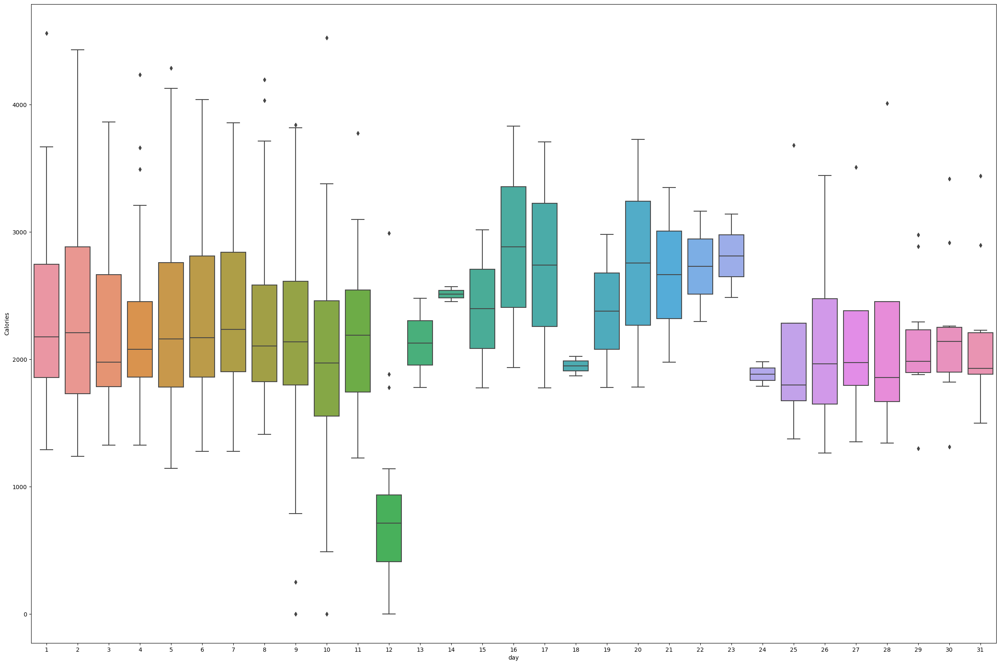

In [23]:
plt.figure(figsize=(30,20) )
sns.boxplot(x  = df.day , y  =df.Calories )

In [24]:
df['week'] = pd.DatetimeIndex(df.ActivityDate).week

C:\Users\Sameer\AppData\Local\Temp\ipykernel_15492\1869402278.py:1: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  df['week'] = pd.DatetimeIndex(df.ActivityDate).week


In [25]:
df

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,date,day,month,year,week
0,1503960366,3/25/2016,11004,7.110000,7.110000,0.0,2.57,0.46,4.07,0.00,33,12,205,804,1819,2016-03-25,25,3,2016,12
1,1503960366,3/26/2016,17609,11.550000,11.550000,0.0,6.92,0.73,3.91,0.00,89,17,274,588,2154,2016-03-26,26,3,2016,12
2,1503960366,3/27/2016,12736,8.530000,8.530000,0.0,4.66,0.16,3.71,0.00,56,5,268,605,1944,2016-03-27,27,3,2016,12
3,1503960366,3/28/2016,13231,8.930000,8.930000,0.0,3.19,0.79,4.95,0.00,39,20,224,1080,1932,2016-03-28,28,3,2016,13
4,1503960366,3/29/2016,12041,7.850000,7.850000,0.0,2.16,1.09,4.61,0.00,28,28,243,763,1886,2016-03-29,29,3,2016,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,8877689391,4/8/2016,23014,20.389999,20.389999,0.0,11.10,0.63,8.62,0.00,70,29,359,982,4196,2016-04-08,8,4,2016,14
453,8877689391,4/9/2016,16470,8.070000,8.070000,0.0,0.00,0.02,8.02,0.00,90,9,289,1052,3841,2016-04-09,9,4,2016,14
454,8877689391,4/10/2016,28497,27.530001,27.530001,0.0,21.92,1.12,4.46,0.00,128,46,211,1055,4526,2016-04-10,10,4,2016,14
455,8877689391,4/11/2016,10622,8.060000,8.060000,0.0,1.47,0.15,6.37,0.01,18,7,225,1190,2820,2016-04-11,11,4,2016,15


In [30]:
pd.pandas.set_option('display.max_columns' ,None)

In [33]:
df_train = pd.read_csv("Dataset/black_friday_train.csv")
df_train.head()

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
0,1000001,P00069042,F,0-17,10,A,2,0,3,NaN,NaN,8370
1,1000001,P00248942,F,0-17,10,A,2,0,1,6.0,14.0,15200
2,1000001,P00087842,F,0-17,10,A,2,0,12,NaN,NaN,1422
3,1000001,P00085442,F,0-17,10,A,2,0,12,14.0,NaN,1057
4,1000002,P00285442,M,55+,16,C,4+,0,8,NaN,NaN,7969


In [34]:
df_train.shape

(550068, 12)

In [35]:
df_test = pd.read_csv("Dataset/black_friday_test.csv")

In [36]:
df_test.shape

(233599, 11)

In [62]:
df = df_train.append(df_test)

C:\Users\Sameer\AppData\Local\Temp\ipykernel_15492\925505788.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df_train.append(df_test)


In [42]:
df.tail()

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
233594,1006036,P00118942,F,26-35,15,B,4+,1,8,NaN,NaN,NaN
233595,1006036,P00254642,F,26-35,15,B,4+,1,5,8.0,NaN,NaN
233596,1006036,P00031842,F,26-35,15,B,4+,1,1,5.0,12.0,NaN
233597,1006037,P00124742,F,46-50,1,C,4+,0,10,16.0,NaN,NaN
233598,1006039,P00316642,F,46-50,0,B,4+,1,4,5.0,NaN,NaN


In [44]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 783667 entries, 0 to 233598
Data columns (total 12 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   User_ID                     783667 non-null  int64  
 1   Product_ID                  783667 non-null  object 
 2   Gender                      783667 non-null  object 
 3   Age                         783667 non-null  object 
 4   Occupation                  783667 non-null  int64  
 5   City_Category               783667 non-null  object 
 6   Stay_In_Current_City_Years  783667 non-null  object 
 7   Marital_Status              783667 non-null  int64  
 8   Product_Category_1          783667 non-null  int64  
 9   Product_Category_2          537685 non-null  float64
 10  Product_Category_3          237858 non-null  float64
 11  Purchase                    550068 non-null  float64
dtypes: float64(3), int64(4), object(5)
memory usage: 77.7+ MB


In [45]:
df.describe()

,User_ID,Occupation,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
count,7.836670e+05,783667.000000,783667.000000,783667.000000,537685.000000,237858.000000,550068.000000
mean,1.003029e+06,8.079300,0.409777,5.366196,9.844506,12.668605,9263.968713
std,1.727267e+03,6.522206,0.491793,3.878160,5.089093,4.125510,5023.065394
min,1.000001e+06,0.000000,0.000000,1.000000,2.000000,3.000000,12.000000
25%,1.001519e+06,2.000000,0.000000,1.000000,5.000000,9.000000,5823.000000
50%,1.003075e+06,7.000000,0.000000,5.000000,9.000000,14.000000,8047.000000
75%,1.004478e+06,14.000000,1.000000,8.000000,15.000000,16.000000,12054.000000
max,1.006040e+06,20.000000,1.000000,20.000000,18.000000,18.000000,23961.000000


In [63]:
df = df.drop(['User_ID'] ,axis = 1)

In [50]:
df 

,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
0,P00069042,F,0-17,10,A,2,0,3,NaN,NaN,8370.0
1,P00248942,F,0-17,10,A,2,0,1,6.0,14.0,15200.0
2,P00087842,F,0-17,10,A,2,0,12,NaN,NaN,1422.0
3,P00085442,F,0-17,10,A,2,0,12,14.0,NaN,1057.0
4,P00285442,M,55+,16,C,4+,0,8,NaN,NaN,7969.0
...,...,...,...,...,...,...,...,...,...,...,...
233594,P00118942,F,26-35,15,B,4+,1,8,NaN,NaN,NaN
233595,P00254642,F,26-35,15,B,4+,1,5,8.0,NaN,NaN
233596,P00031842,F,26-35,15,B,4+,1,1,5.0,12.0,NaN
233597,P00124742,F,46-50,1,C,4+,0,10,16.0,NaN,NaN


In [59]:
df.head()

,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
0,P00069042,0,0-17,10,A,2,0,3,NaN,NaN,8370.0
1,P00248942,0,0-17,10,A,2,0,1,6.0,14.0,15200.0
2,P00087842,0,0-17,10,A,2,0,12,NaN,NaN,1422.0
3,P00085442,0,0-17,10,A,2,0,12,14.0,NaN,1057.0
4,P00285442,1,55+,16,C,4+,0,8,NaN,NaN,7969.0


In [55]:
df.Age.value_counts()

26-35    313015
36-45    156724
18-25    141953
46-50     65278
51-55     54784
55+       30579
0-17      21334
Name: Age, dtype: int64

In [53]:
# for solving gender by pd.getdummmies

In [64]:
#handling catagorical feature gender
#df['gender'] = pd.get_dummies(df[Gender],drop_first = 1)
df['Gender'] = df['Gender'].map({'F': 0,'M':1 })

In [65]:
df.head()

,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
0,P00069042,0,0-17,10,A,2,0,3,NaN,NaN,8370.0
1,P00248942,0,0-17,10,A,2,0,1,6.0,14.0,15200.0
2,P00087842,0,0-17,10,A,2,0,12,NaN,NaN,1422.0
3,P00085442,0,0-17,10,A,2,0,12,14.0,NaN,1057.0
4,P00285442,1,55+,16,C,4+,0,8,NaN,NaN,7969.0


In [66]:
df.Age.unique()

array(['0-17', '55+', '26-35', '46-50', '51-55', '36-45', '18-25'],
      dtype=object)

In [69]:
#df['Age'] = pd.get_dummies(df['Age'],drop_first  = True)

In [70]:
df['Age'].value_counts()

26-35    313015
36-45    156724
18-25    141953
46-50     65278
51-55     54784
55+       30579
0-17      21334
Name: Age, dtype: int64

In [71]:
pd.get_dummies(df['Age'])

,18-25,26-35,36-45,46-50,51-55,55+
0,0,0,0,0,0,0
1,0,0,0,0,0,0
2,0,0,0,0,0,0
3,0,0,0,0,0,0
4,0,0,0,0,0,1
...,...,...,...,...,...,...
233594,0,1,0,0,0,0
233595,0,1,0,0,0,0
233596,0,1,0,0,0,0
233597,0,0,0,1,0,0


In [73]:
df['Age'] = df['Age'].map({'0-17' : 1,'18-25' : 2,'26-35':3,'36-45' : 4,'46-50':5,'51-55' :6,'55+':7 }) 

In [74]:
df.head()

,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
0,P00069042,0,1.0,10,A,2,0,3,NaN,NaN,8370.0
1,P00248942,0,1.0,10,A,2,0,1,6.0,14.0,15200.0
2,P00087842,0,1.0,10,A,2,0,12,NaN,NaN,1422.0
3,P00085442,0,1.0,10,A,2,0,12,14.0,NaN,1057.0
4,P00285442,1,7.0,16,C,4+,0,8,NaN,NaN,7969.0


In [78]:
df_city = pd.get_dummies(df['City_Category'] ,drop_first = True)

In [80]:
df = pd.concat([df, df_city] , axis = 1)
df.head()

,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase,B,C
0,P00069042,0,1.0,10,A,2,0,3,NaN,NaN,8370.0,0,0
1,P00248942,0,1.0,10,A,2,0,1,6.0,14.0,15200.0,0,0
2,P00087842,0,1.0,10,A,2,0,12,NaN,NaN,1422.0,0,0
3,P00085442,0,1.0,10,A,2,0,12,14.0,NaN,1057.0,0,0
4,P00285442,1,7.0,16,C,4+,0,8,NaN,NaN,7969.0,0,1


In [83]:
#droping city catagory
df.drop('City_Category',axis = 1,inplace = True)

In [84]:
df

,Product_ID,Gender,Age,Occupation,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase,B,C
0,P00069042,0,1.0,10,2,0,3,NaN,NaN,8370.0,0,0
1,P00248942,0,1.0,10,2,0,1,6.0,14.0,15200.0,0,0
2,P00087842,0,1.0,10,2,0,12,NaN,NaN,1422.0,0,0
3,P00085442,0,1.0,10,2,0,12,14.0,NaN,1057.0,0,0
4,P00285442,1,7.0,16,4+,0,8,NaN,NaN,7969.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
233594,P00118942,0,3.0,15,4+,1,8,NaN,NaN,NaN,1,0
233595,P00254642,0,3.0,15,4+,1,5,8.0,NaN,NaN,1,0
233596,P00031842,0,3.0,15,4+,1,1,5.0,12.0,NaN,1,0
233597,P00124742,0,5.0,1,4+,0,10,16.0,NaN,NaN,0,1


In [85]:
df.isnull().sum()

Product_ID                         0
Gender                             0
Age                           141953
Occupation                         0
Stay_In_Current_City_Years         0
Marital_Status                     0
Product_Category_1                 0
Product_Category_2            245982
Product_Category_3            545809
Purchase                      233599
B                                  0
C                                  0
dtype: int64

In [86]:
df.shape

(783667, 12)

In [88]:
#focus on replacing missing values
df.Product_Category_1.unique()

array([ 3,  1, 12,  8,  5,  4,  2,  6, 14, 11, 13, 15,  7, 16, 18, 10, 17,
        9, 20, 19], dtype=int64)

In [92]:
df['Product_Category_2'].value_counts()

8.0     91317
14.0    78834
2.0     70498
16.0    61687
15.0    54114
5.0     37165
4.0     36705
6.0     23575
11.0    20230
17.0    19104
13.0    15054
9.0      8177
12.0     7801
10.0     4420
3.0      4123
18.0     4027
7.0       854
Name: Product_Category_2, dtype: int64

In [98]:
mode = df['Product_Category_2'].mode()

0    8.0
Name: Product_Category_2, dtype: float64

In [99]:
#replacing missing values with mode
df['Product_Category_2']=df['Product_Category_2'].fillna(df['Product_Category_2'].mode()[0])

In [100]:
df

,Product_ID,Gender,Age,Occupation,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase,B,C
0,P00069042,0,1.0,10,2,0,3,8.0,NaN,8370.0,0,0
1,P00248942,0,1.0,10,2,0,1,6.0,14.0,15200.0,0,0
2,P00087842,0,1.0,10,2,0,12,8.0,NaN,1422.0,0,0
3,P00085442,0,1.0,10,2,0,12,14.0,NaN,1057.0,0,0
4,P00285442,1,7.0,16,4+,0,8,8.0,NaN,7969.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
233594,P00118942,0,3.0,15,4+,1,8,8.0,NaN,NaN,1,0
233595,P00254642,0,3.0,15,4+,1,5,8.0,NaN,NaN,1,0
233596,P00031842,0,3.0,15,4+,1,1,5.0,12.0,NaN,1,0
233597,P00124742,0,5.0,1,4+,0,10,16.0,NaN,NaN,0,1


In [102]:
df['Product_Category_2'].isnull().sum()

0

In [104]:
#Product catagory 3 replacing missing values
df['Product_Category_3'] = df['Product_Category_3'].fillna(df['Product_Category_3'].mode()[0])

In [105]:
df['Product_Category_3'].isnull().sum()

0

In [106]:
df.isnull().sum()

Product_ID                         0
Gender                             0
Age                           141953
Occupation                         0
Stay_In_Current_City_Years         0
Marital_Status                     0
Product_Category_1                 0
Product_Category_2                 0
Product_Category_3                 0
Purchase                      233599
B                                  0
C                                  0
dtype: int64

In [107]:
df['Age'].unique()

array([ 1.,  7.,  3.,  5.,  6.,  4., nan])

In [110]:
df['Age'] = df['Age'].fillna(2)

In [111]:
df.isnull().sum()

Product_ID                         0
Gender                             0
Age                                0
Occupation                         0
Stay_In_Current_City_Years         0
Marital_Status                     0
Product_Category_1                 0
Product_Category_2                 0
Product_Category_3                 0
Purchase                      233599
B                                  0
C                                  0
dtype: int64

In [115]:
df['Stay_In_Current_City_Years'] =df['Stay_In_Current_City_Years'].str.replace('+','')

C:\Users\Sameer\AppData\Local\Temp\ipykernel_15492\3455640247.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df['Stay_In_Current_City_Years'] =df['Stay_In_Current_City_Years'].str.replace('+','')


In [116]:
df.head()

,Product_ID,Gender,Age,Occupation,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase,B,C
0,P00069042,0,1.0,10,2,0,3,8.0,16.0,8370.0,0,0
1,P00248942,0,1.0,10,2,0,1,6.0,14.0,15200.0,0,0
2,P00087842,0,1.0,10,2,0,12,8.0,16.0,1422.0,0,0
3,P00085442,0,1.0,10,2,0,12,14.0,16.0,1057.0,0,0
4,P00285442,1,7.0,16,4,0,8,8.0,16.0,7969.0,0,1


In [117]:
#converting objects into integers

In [123]:
df['Stay_In_Current_City_Years'] = df['Stay_In_Current_City_Years'].astype(int)

In [124]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 783667 entries, 0 to 233598
Data columns (total 12 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Product_ID                  783667 non-null  object 
 1   Gender                      783667 non-null  int64  
 2   Age                         783667 non-null  float64
 3   Occupation                  783667 non-null  int64  
 4   Stay_In_Current_City_Years  783667 non-null  int32  
 5   Marital_Status              783667 non-null  int64  
 6   Product_Category_1          783667 non-null  int64  
 7   Product_Category_2          783667 non-null  float64
 8   Product_Category_3          783667 non-null  float64
 9   Purchase                    550068 non-null  float64
 10  B                           783667 non-null  uint8  
 11  C                           783667 non-null  uint8  
dtypes: float64(4), int32(1), int64(4), object(1), uint8(2)
memory usage: 64.

In [125]:
df['B'] = df['B'].astype(int)

In [126]:
df['C'] = df['C'].astype(int)

In [127]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 783667 entries, 0 to 233598
Data columns (total 12 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Product_ID                  783667 non-null  object 
 1   Gender                      783667 non-null  int64  
 2   Age                         783667 non-null  float64
 3   Occupation                  783667 non-null  int64  
 4   Stay_In_Current_City_Years  783667 non-null  int32  
 5   Marital_Status              783667 non-null  int64  
 6   Product_Category_1          783667 non-null  int64  
 7   Product_Category_2          783667 non-null  float64
 8   Product_Category_3          783667 non-null  float64
 9   Purchase                    550068 non-null  float64
 10  B                           783667 non-null  int32  
 11  C                           783667 non-null  int32  
dtypes: float64(4), int32(3), int64(4), object(1)
memory usage: 68.8+ MB


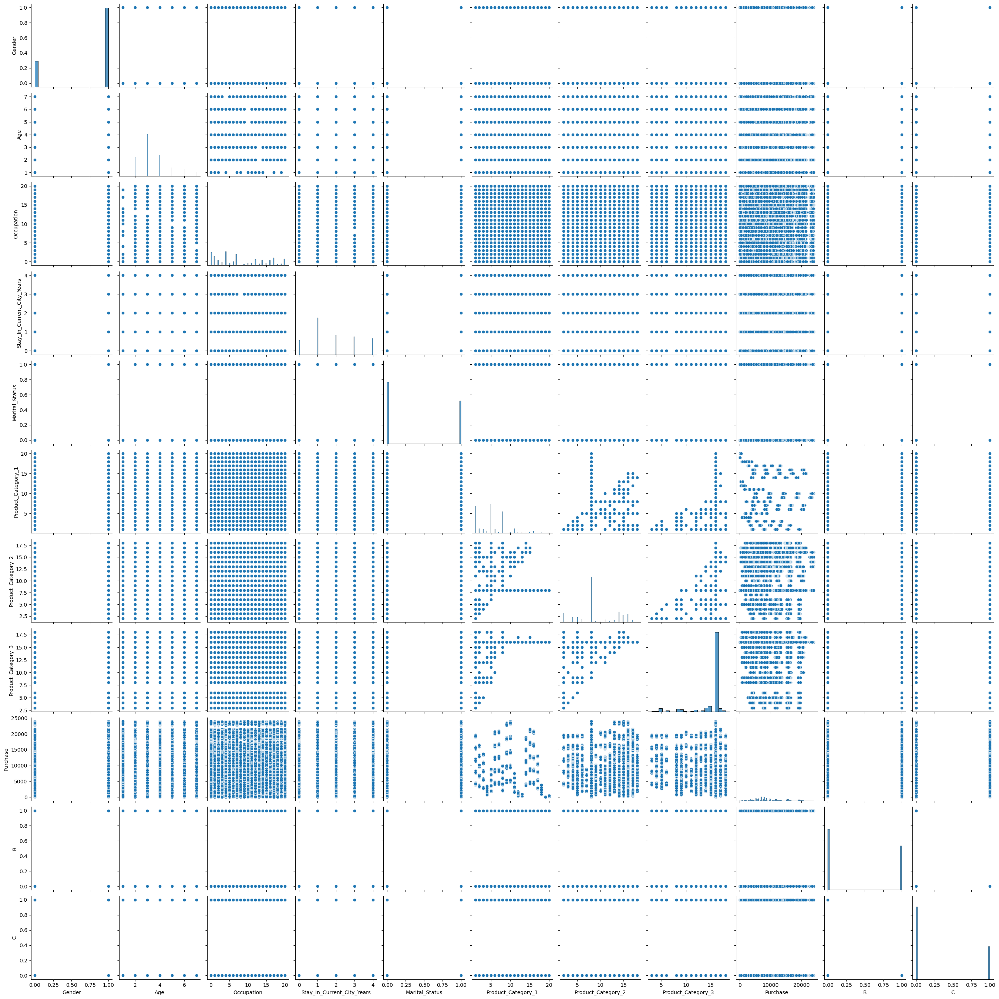

In [128]:
# Visualizatoion
sns.pairplot(df)

<Axes: xlabel='Age', ylabel='Purchase'>

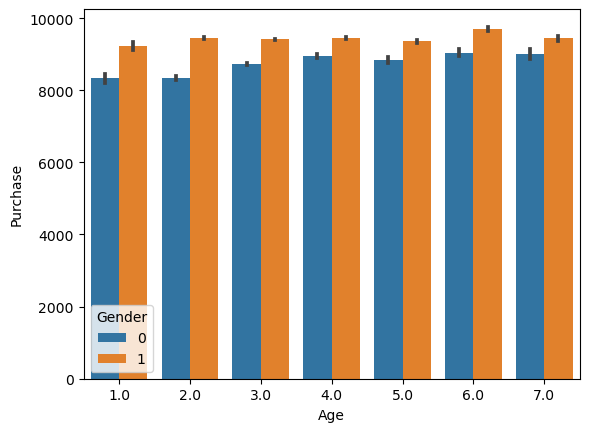

In [130]:
 sns.barplot(x = df.Age , y = df.Purchase, hue = df.Gender)

<Axes: xlabel='Occupation', ylabel='Purchase'>

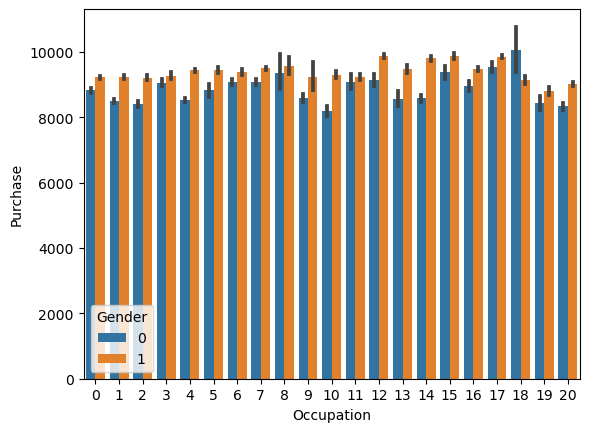

In [133]:
#Visualization of purchase with occupation
sns.barplot(x = df.Occupation , y = df.Purchase, hue = df.Gender)

<Axes: xlabel='Product_Category_1', ylabel='Purchase'>

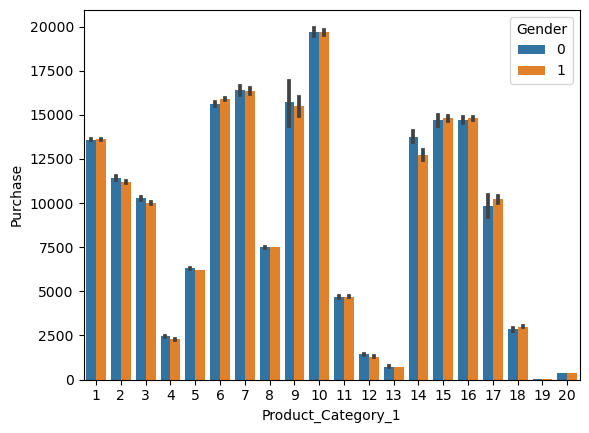

In [134]:
sns.barplot(x = df.Product_Category_1 , y = df.Purchase, hue = df.Gender)

<Axes: xlabel='Product_Category_2', ylabel='Purchase'>

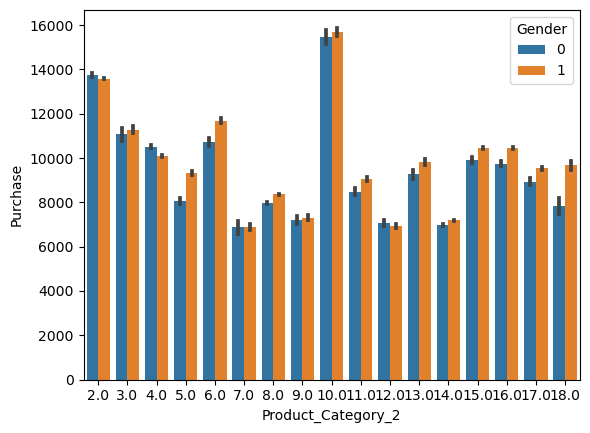

In [135]:
sns.barplot(x = df.Product_Category_2 , y = df.Purchase, hue = df.Gender)

<Axes: xlabel='Product_Category_3', ylabel='Purchase'>

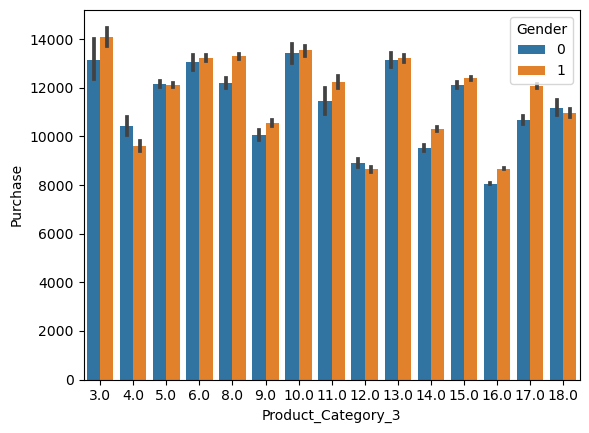

In [136]:
sns.barplot(x = df.Product_Category_3 , y = df.Purchase, hue = df.Gender)

In [138]:
df.drop('Product_ID' ,axis = 1,inplace = True)

In [167]:
df_train

,Gender,Age,Occupation,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase,B,C
0,0,1.0,10,2,0,3,8.0,16.0,8370.0,0,0
1,0,1.0,10,2,0,1,6.0,14.0,15200.0,0,0
2,0,1.0,10,2,0,12,8.0,16.0,1422.0,0,0
3,0,1.0,10,2,0,12,14.0,16.0,1057.0,0,0
4,1,7.0,16,4,0,8,8.0,16.0,7969.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
550063,1,6.0,13,1,1,20,8.0,16.0,368.0,1,0
550064,0,3.0,1,3,0,20,8.0,16.0,371.0,0,1
550065,0,3.0,15,4,1,20,8.0,16.0,137.0,1,0
550066,0,7.0,1,2,0,20,8.0,16.0,365.0,0,1


In [157]:
df_train =  df[~df['Purchase'].isnull()]

In [159]:
df_test = df[df['Purchase'].isnull()]

In [176]:
df_test

,Gender,Age,Occupation,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase,B,C
0,1,5.0,7,2,1,1,11.0,16.0,NaN,1,0
1,1,3.0,17,0,0,3,5.0,16.0,NaN,0,1
2,0,4.0,1,4,1,5,14.0,16.0,NaN,1,0
3,0,4.0,1,4,1,4,9.0,16.0,NaN,1,0
4,0,3.0,1,1,0,4,5.0,12.0,NaN,0,1
...,...,...,...,...,...,...,...,...,...,...,...
233594,0,3.0,15,4,1,8,8.0,16.0,NaN,1,0
233595,0,3.0,15,4,1,5,8.0,16.0,NaN,1,0
233596,0,3.0,15,4,1,1,5.0,12.0,NaN,1,0
233597,0,5.0,1,4,0,10,16.0,16.0,NaN,0,1


In [160]:
from sklearn.preprocessing import StandardScaler

In [161]:
sc = StandardScaler()

In [172]:
X = df_train[:]
y = df_train['Purchase']
X.shape


(550068, 11)

In [166]:
df_train[:-1]

,Gender,Age,Occupation,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase,B,C
0,0,1.0,10,2,0,3,8.0,16.0,8370.0,0,0
1,0,1.0,10,2,0,1,6.0,14.0,15200.0,0,0
2,0,1.0,10,2,0,12,8.0,16.0,1422.0,0,0
3,0,1.0,10,2,0,12,14.0,16.0,1057.0,0,0
4,1,7.0,16,4,0,8,8.0,16.0,7969.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
550062,1,5.0,7,3,0,20,8.0,16.0,473.0,0,0
550063,1,6.0,13,1,1,20,8.0,16.0,368.0,1,0
550064,0,3.0,1,3,0,20,8.0,16.0,371.0,0,1
550065,0,3.0,15,4,1,20,8.0,16.0,137.0,1,0


In [173]:
y.shape

(550068,)

In [174]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

<IPython.core.display.Javascript object>

In [175]:
X_train = sc.fit_transform(X_train)
X_test = sc.fit_transform(X_test)

In [179]:
X

,Gender,Age,Occupation,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase,B,C
0,0,1.0,10,2,0,3,8.0,16.0,8370.0,0,0
1,0,1.0,10,2,0,1,6.0,14.0,15200.0,0,0
2,0,1.0,10,2,0,12,8.0,16.0,1422.0,0,0
3,0,1.0,10,2,0,12,14.0,16.0,1057.0,0,0
4,1,7.0,16,4,0,8,8.0,16.0,7969.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
550063,1,6.0,13,1,1,20,8.0,16.0,368.0,1,0
550064,0,3.0,1,3,0,20,8.0,16.0,371.0,0,1
550065,0,3.0,15,4,1,20,8.0,16.0,137.0,1,0
550066,0,7.0,1,2,0,20,8.0,16.0,365.0,0,1


In [178]:
y

0          8370.0
1         15200.0
2          1422.0
3          1057.0
4          7969.0
           ...   
550063      368.0
550064      371.0
550065      137.0
550066      365.0
550067      490.0
Name: Purchase, Length: 550068, dtype: float64